In [1]:
# Importing libraries
import re
import sys
import json
import praw
import math
import string
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pyLDAvis
import pyLDAvis.lda_model
from itertools import chain
from textblob import TextBlob
from wordcloud import WordCloud
from collections import Counter
from praw.models import MoreComments

# Importing Scikit-learn libraries
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# Importing NLTK libraries
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from nltk.tokenize import RegexpTokenizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer




# Downloading NLTK stopwords
nltk.download('stopwords')
# Downloading NLTK vader lexicon
nltk.download('vader_lexicon')
# Downloading NLTK punkt tokenizer
nltk.download('punkt')
nltk.download('punkt_tab')

# Ignoring warnings
import warnings
warnings.filterwarnings("ignore")


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/avriowork/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/avriowork/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /Users/avriowork/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/avriowork/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use("seaborn-v0_8")

# Setting aesthetic parameters for plots
sns.set_theme(style="whitegrid")
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['figure.figsize'] = (16, 10)
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['axes.labelweight'] = 'bold'

In [3]:
merged_data_path = '../Data/merged_youtube_data.json'

with open(merged_data_path, 'r') as file:
    merged_data = json.load(file)

records = []
# Extract all video records from the merged data and comment data and replies data
for video in merged_data:
    title = video.get('title', '')
    desc = video.get('description', '')
    
    # First row: title + description
    records.append({
        'videoId': video.get('videoId', ''),
        'text': f"{title}\n\n{desc}",
        'title': title,
        'description': desc,
        'channelTitle': video.get('channelTitle', ''),
        'videoPublishedAt': video.get('videoPublishedAt', ''),
        'tags': video.get('tags', []),
        'viewCount':  video.get('viewCount', 0),
        'videoLikeCount': video.get('videoLikeCount', 0),
        'videoCommentCount': video.get('videoCommentCount', 0),
        'type': 'video'
    })
    for comment in video.get('comments', []):
        comment_text = comment.get('text', '')
        records.append({
            'videoId': video.get('videoId', ''),
            "commentId": comment.get('commentId', ''),
            "author":  comment.get('author', ''),
            "text": comment_text, 
            "likeCount": comment.get('likeCount', 0), 
            "publishedAt": comment.get('publishedAt', ''), 
            "parentId": comment.get('parentId', ''),
            "authorChannelId":  comment.get('authorChannelId', ''),
            "type": 'comment',
        })
        # if isinstance(comment.get('replies'), MoreComments):
        if len(comment.get('replies', [])) > 0:
            # If replies are of type MoreComments, we need to fetch them
            comment['replies'] = comment['replies']
            for reply in comment.get('replies', []):
                reply_text = reply.get('text', '')
                records.append({
                    'videoId': video.get('videoId', ''),
                    "commentId": reply.get('commentId', ''),
                    "author":  reply.get('author', ''),
                    "text": reply_text, 
                    "likeCount": reply.get('likeCount', 0), 
                    "publishedAt": reply.get('publishedAt', ''), 
                    "parentId": reply.get('parentId', ''),
                    "authorChannelId":  reply.get('authorChannelId', ''),
                    "type": 'reply',
                })

df = pd.DataFrame(records)


In [4]:
df.head()

,videoId,text,title,description,channelTitle,videoPublishedAt,tags,viewCount,videoLikeCount,videoCommentCount,type,commentId,author,likeCount,publishedAt,parentId,authorChannelId
0,x_DyyPMaVR0,Russia-Ukraine: Trump calls Putin 'crazy’ afte...,Russia-Ukraine: Trump calls Putin 'crazy’ afte...,"In Ukraine, swarms of Russian drones filled th...",Channel 4 News,2025-05-26T17:50:04Z,Russia;Ukraine;Turkey;Ankara;Russia Ukraine Wa...,62099,544,455,video,NaN,NaN,NaN,NaN,NaN,NaN
1,x_DyyPMaVR0,Yet no mention of the fact that in the recent ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,comment,UgyYRQsBSosygi4eLNF4AaABAg,@richieboy1971,0.0,2025-05-27T04:41:25Z,None,UCqaL9sb-wqAKneSzwju92OA
2,x_DyyPMaVR0,Trump talks a lot but none of it ever transfor...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,comment,UgzbI_K-OCQ6Baxyw-J4AaABAg,@Turtle_Zed,0.0,2025-05-27T04:34:40Z,None,UCNImr4HOMoOBjb3Y0MUW-Uw
3,x_DyyPMaVR0,Haaha the russian bots are terrified. Just bas...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,comment,UgzE02o83Kt_RW3_x054AaABAg,@Vykandar,0.0,2025-05-27T04:30:09Z,None,UC92JUclfl0YcAqK4xlpRc_w
4,x_DyyPMaVR0,send the troops president trump,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,comment,Ugy_5MssCvruQIlLRBR4AaABAg,@stmartinshirt,0.0,2025-05-27T04:29:53Z,None,UC_hAirOy_3qohESaQ0P6ttg


In [5]:
df.dtypes

videoId               object
text                  object
title                 object
description           object
channelTitle          object
videoPublishedAt      object
tags                  object
viewCount             object
videoLikeCount        object
videoCommentCount     object
type                  object
commentId             object
author                object
likeCount            float64
publishedAt           object
parentId              object
authorChannelId       object
dtype: object

In [6]:
# Define the data types of the columns
df['viewCount'] = pd.to_numeric(df['viewCount'], errors='coerce')
df['videoLikeCount'] = pd.to_numeric(df['videoLikeCount'], errors='coerce')
df['videoCommentCount'] = pd.to_numeric(df['videoCommentCount'], errors='coerce')
df['likeCount'] = pd.to_numeric(df['likeCount'], errors='coerce')
df['publishedAt'] = pd.to_datetime(df['publishedAt'], errors='coerce')
df['videoPublishedAt'] = pd.to_datetime(df['videoPublishedAt'], errors='coerce')
df['text'] = df['text'].astype(str)
df['title'] = df['title'].astype(str)
df['description'] = df['description'].astype(str)
df['channelTitle'] = df['channelTitle'].astype(str)
# df['tags'] = df['tags'].apply(lambda x: x if isinstance(x, list) else [])
df['type'] = df['type'].astype(str)

df.dtypes

videoId                           object
text                              object
title                             object
description                       object
channelTitle                      object
videoPublishedAt     datetime64[ns, UTC]
tags                              object
viewCount                        float64
videoLikeCount                   float64
videoCommentCount                float64
type                              object
commentId                         object
author                            object
likeCount                        float64
publishedAt          datetime64[ns, UTC]
parentId                          object
authorChannelId                   object
dtype: object

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51254 entries, 0 to 51253
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype              
---  ------             --------------  -----              
 0   videoId            51254 non-null  object             
 1   text               51254 non-null  object             
 2   title              51254 non-null  object             
 3   description        51254 non-null  object             
 4   channelTitle       51254 non-null  object             
 5   videoPublishedAt   175 non-null    datetime64[ns, UTC]
 6   tags               175 non-null    object             
 7   viewCount          175 non-null    float64            
 8   videoLikeCount     174 non-null    float64            
 9   videoCommentCount  175 non-null    float64            
 10  type               51254 non-null  object             
 11  commentId          51079 non-null  object             
 12  author             51079 non-null  object     

In [8]:
df.describe()

,viewCount,videoLikeCount,videoCommentCount,likeCount
count,1.750000e+02,174.000000,175.00000,51079.000000
mean,1.475762e+05,2803.827586,479.60000,2.760175
std,3.517949e+05,5780.746180,945.02162,16.025037
min,9.940000e+02,22.000000,10.00000,0.000000
25%,2.374500e+04,288.000000,41.00000,0.000000
50%,5.164800e+04,773.000000,126.00000,0.000000
75%,1.578670e+05,2906.500000,449.50000,1.000000
max,3.978011e+06,41734.000000,6808.00000,857.000000


In [9]:
df.shape

(51254, 17)

In [10]:
tokenizer = RegexpTokenizer(r"[a-zA-Z]+(?:[-'][a-zA-Z]+)?")
stemmer = PorterStemmer()
stop_words = set(stopwords.words("english"))

# Basic cleaning & abbreviation setup
abbreviations = {
    "lol": "laugh out loud", "omg": "oh my god", "idk": "i don't know",
    "rn": "right now", "u": "you", "ur": "your", "btw": "by the way",
    "brb": "be right back", "thx": "thanks", "pls": "please", "imo": "in my opinion",
    "fwiw": "for what it's worth", "lmao": "laughing my ass off"
}

#  Clean + tokenize + stem function
def process_text(text):
    if not text or not isinstance(text, str):
        return []
    
 
    # Lowercase, remove zero-width spaces
    text = text.replace('\u200b', '').lower()
 
    # Expand abbreviations
    for abbr, full in abbreviations.items():
        text = re.sub(rf'\b{abbr}\b', full, text)
 
    # Remove URLs and mentions
    text = re.sub(r"http\S+|www\S+", "", text)
    text = re.sub(r"@\w+", "", text)
    # Remove HTML tags
    text = re.sub(r'<.*?>', '', text)

    # Remove non-ASCII characters (emojis, special symbols)
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
 
    # Tokenize
    tokens = tokenizer.tokenize(text)
 
    # Remove stopwords and short tokens
    tokens = [t for t in tokens if len(t) > 1 and t not in stop_words]
 
    # Stemming
    stemmed_tokens = [stemmer.stem(t) for t in tokens if t.isalpha()]
    return stemmed_tokens

df['processed_tokens'] = df['text'].apply(process_text)

In [11]:
# Create word frequency dictionary
all_words = [word for tokens in df['processed_tokens'] for word in tokens]
word_freq = Counter(all_words)

# Remove rare words (frequency = 1)
words_to_keep = {word for word, count in word_freq.items() if count > 1}
df['processed_tokens'] = df['processed_tokens'].apply(
    lambda tokens: [w for w in tokens if w in words_to_keep]
)

In [12]:
# Recreate clean text column after filtering rare words
df['clean_text_filtered'] = df['processed_tokens'].apply(
    lambda tokens: " ".join(tokens)
)

In [ ]:
# Display processed data
print("Processed DataFrame:")
print(df[['text', 'processed_tokens', 'clean_text_filtered']].head())


Processed DataFrame:
                                                text  \
0  Russia-Ukraine: Trump calls Putin 'crazy’ afte...   
1  Yet no mention of the fact that in the recent ...   
2  Trump talks a lot but none of it ever transfor...   
3  Haaha the russian bots are terrified. Just bas...   
4                    send the troops president trump   

                                    processed_tokens  \
0  [trump, call, putin, crazi, largest, air, atta...   
1  [yet, mention, fact, recent, negoti, prison, s...   
2  [trump, talk, lot, none, ever, transform, acti...   
3  [russian, bot, terrifi, base, comment, section...   
4                       [send, troop, presid, trump]   

                                 clean_text_filtered  
0  trump call putin crazi largest air attack war ...  
1  yet mention fact recent negoti prison swap ukr...  
2  trump talk lot none ever transform action frie...  
3  russian bot terrifi base comment section tell ...  
4                            s

In [ ]:
# Prepare a side-by-side sample of original text, tokens, and cleaned text
sample_processed = (
    df.assign(
        Original=lambda d: (
            d['text']
             .str.replace(r'\n', ' ', regex=True)
             .str.slice(0, 100)
             .add('…')
        ),
        Cleaned=lambda d: (
            d['clean_text_filtered']
             .str.slice(0, 100)
             .add('…')
        )
    )
    [['Original','Cleaned']]
    .head(10)
)

# Display the table
from IPython.display import display
display(sample_processed)

,Original,Cleaned
0,Russia-Ukraine: Trump calls Putin 'crazy’ afte...,trump call putin crazi largest air attack war ...
1,Yet no mention of the fact that in the recent ...,yet mention fact recent negoti prison swap ukr...
2,Trump talks a lot but none of it ever transfor...,trump talk lot none ever transform action frie...
3,Haaha the russian bots are terrified. Just bas...,russian bot terrifi base comment section tell ...
4,send the troops president trump…,send troop presid trump…
5,"Unfortunately, this was in response to a horre...",unfortun respons horrend ukrainian attack russ...
6,He is not happy with Putin but he is very happ...,happi putin happi kill thousand innoc peopl ga...
7,What about Gaza there not people…,gaza peopl…
8,trump is putins puppet…,trump putin puppet…
9,What plant is Trump from? He’s sending missile...,plant trump send missil ukrain attack russia b...


In [14]:
df.head(5)

,videoId,text,title,description,channelTitle,videoPublishedAt,tags,viewCount,videoLikeCount,videoCommentCount,type,commentId,author,likeCount,publishedAt,parentId,authorChannelId,processed_tokens,clean_text_filtered
0,x_DyyPMaVR0,Russia-Ukraine: Trump calls Putin 'crazy’ afte...,Russia-Ukraine: Trump calls Putin 'crazy’ afte...,"In Ukraine, swarms of Russian drones filled th...",Channel 4 News,2025-05-26 17:50:04+00:00,Russia;Ukraine;Turkey;Ankara;Russia Ukraine Wa...,62099.0,544.0,455.0,video,NaN,NaN,NaN,NaT,NaN,NaN,"[trump, call, putin, crazi, largest, air, atta...",trump call putin crazi largest air attack war ...
1,x_DyyPMaVR0,Yet no mention of the fact that in the recent ...,nan,nan,nan,NaT,NaN,NaN,NaN,NaN,comment,UgyYRQsBSosygi4eLNF4AaABAg,@richieboy1971,0.0,2025-05-27 04:41:25+00:00,None,UCqaL9sb-wqAKneSzwju92OA,"[yet, mention, fact, recent, negoti, prison, s...",yet mention fact recent negoti prison swap ukr...
2,x_DyyPMaVR0,Trump talks a lot but none of it ever transfor...,nan,nan,nan,NaT,NaN,NaN,NaN,NaN,comment,UgzbI_K-OCQ6Baxyw-J4AaABAg,@Turtle_Zed,0.0,2025-05-27 04:34:40+00:00,None,UCNImr4HOMoOBjb3Y0MUW-Uw,"[trump, talk, lot, none, ever, transform, acti...",trump talk lot none ever transform action frie...
3,x_DyyPMaVR0,Haaha the russian bots are terrified. Just bas...,nan,nan,nan,NaT,NaN,NaN,NaN,NaN,comment,UgzE02o83Kt_RW3_x054AaABAg,@Vykandar,0.0,2025-05-27 04:30:09+00:00,None,UC92JUclfl0YcAqK4xlpRc_w,"[russian, bot, terrifi, base, comment, section...",russian bot terrifi base comment section tell ...
4,x_DyyPMaVR0,send the troops president trump,nan,nan,nan,NaT,NaN,NaN,NaN,NaN,comment,Ugy_5MssCvruQIlLRBR4AaABAg,@stmartinshirt,0.0,2025-05-27 04:29:53+00:00,None,UC_hAirOy_3qohESaQ0P6ttg,"[send, troop, presid, trump]",send troop presid trump


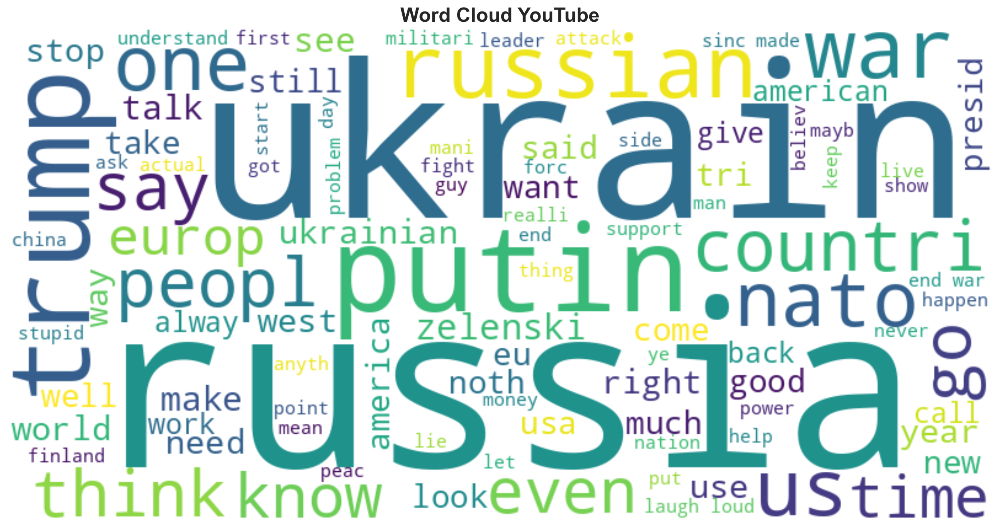

In [27]:

# Generate word cloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt

all_text = " ".join(df['clean_text_filtered'])
wordcloud = WordCloud(width=800, height=400, 
                     background_color='white',
                     max_words=100).generate(all_text)

# plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Word Cloud YouTube")
plt.show()


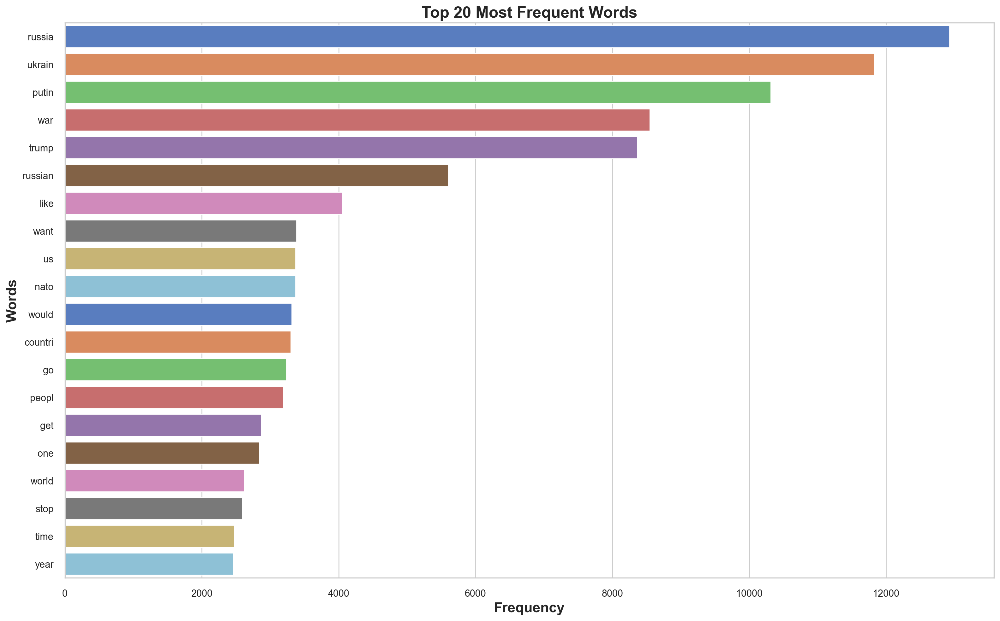

In [16]:

# Show top 20 most common words
top_words = word_freq.most_common(20)
words, counts = zip(*top_words)

# plt.figure(figsize=(12, 6))
sns.barplot(x=counts, y=words, palette='muted', hue=words, orient='horizontal')
plt.title("Top 20 Most Frequent Words")
plt.xlabel("Frequency")
plt.ylabel('Words')
plt.tight_layout()
plt.show()




In [17]:
# Initializing VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Applying VADER sentiment scoring
df["sentiment_score"] = df["clean_text_filtered"].apply(lambda x: sid.polarity_scores(x)["compound"])


def classify_sentiment(score):
    if score >= 0.01:    # More lenient for Positive
        return "Positive"
    elif score <= -0.01: # More lenient for Negative
        return "Negative"
    return "Neutral"

# Apply classification
df["sentiment"] = df["sentiment_score"].apply(classify_sentiment)

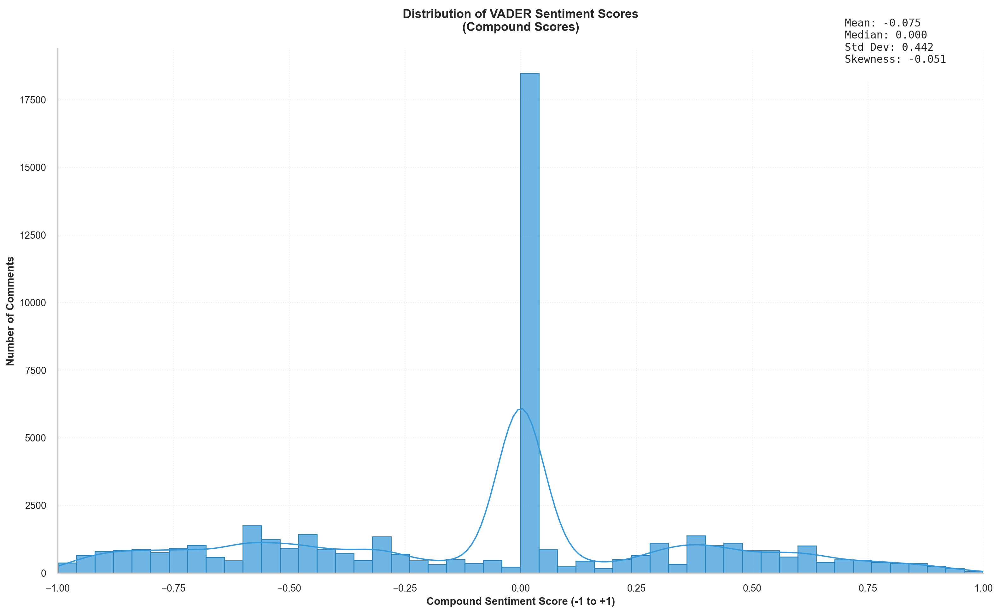

In [18]:
# Set up the figure
# plt.figure(figsize=(12, 6))

# Create distribution plot
ax = sns.histplot(df['sentiment_score'], 
                 bins=50, 
                 kde=True,
                 color='#3498db',
                 edgecolor='#2980b9',
                 alpha=0.7)


# Formatting
plt.title('Distribution of VADER Sentiment Scores\n(Compound Scores)', 
         fontsize=14, pad=20)
plt.xlabel('Compound Sentiment Score (-1 to +1)', fontsize=12)
plt.ylabel('Number of Comments', fontsize=12)
plt.xlim(-1, 1)
plt.grid(True, linestyle=':', alpha=0.3)

# Add statistics box
stats_text = f"""
Mean: {df['sentiment_score'].mean():.3f}
Median: {df['sentiment_score'].median():.3f}
Std Dev: {df['sentiment_score'].std():.3f}
Skewness: {df['sentiment_score'].skew():.3f}
"""
plt.text(0.85, 0.95, stats_text, 
         transform=ax.transAxes,
         bbox=dict(facecolor='white', alpha=0.8),
         fontfamily='monospace')

sns.despine()
plt.tight_layout()
plt.show()

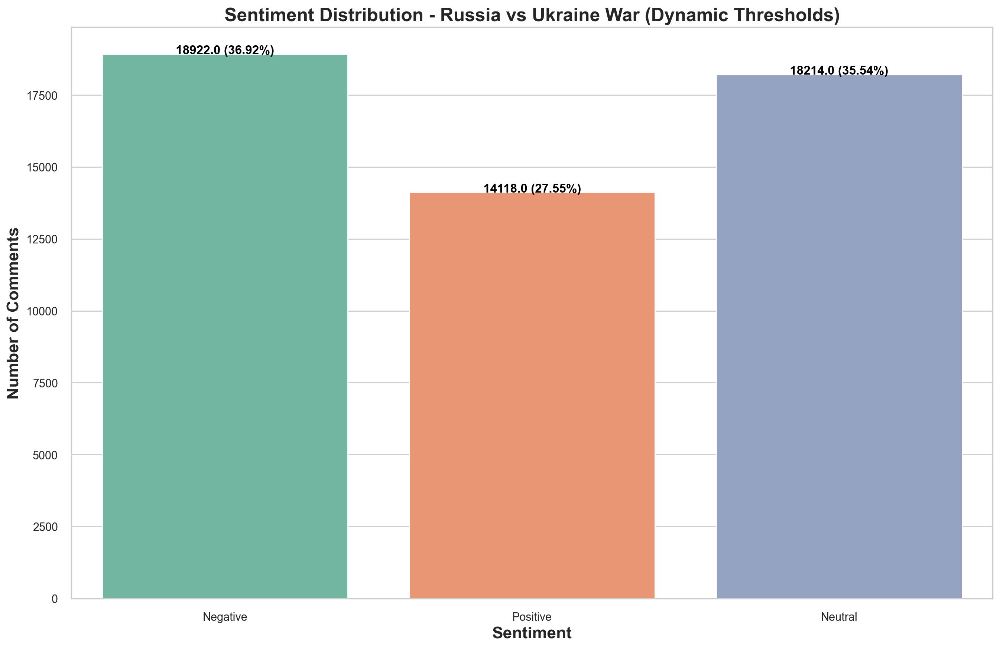

In [19]:
ax = sns.countplot(data=df, x='sentiment', palette='Set2', hue='sentiment')
plt.title("Sentiment Distribution - Russia vs Ukraine War (Dynamic Thresholds)")
plt.xlabel("Sentiment")
plt.ylabel("Number of Comments")
# plt.grid(True, linestyle="--", alpha=0.5)
total = len(df)
for p in ax.patches:
    height = p.get_height()
    percentage = (height / total) * 100
    ax.text(p.get_x() + p.get_width() / 2, height + 10, f'{height} ({percentage:.2f}%)',
            ha='center', fontweight='bold', color='black')
plt.show()

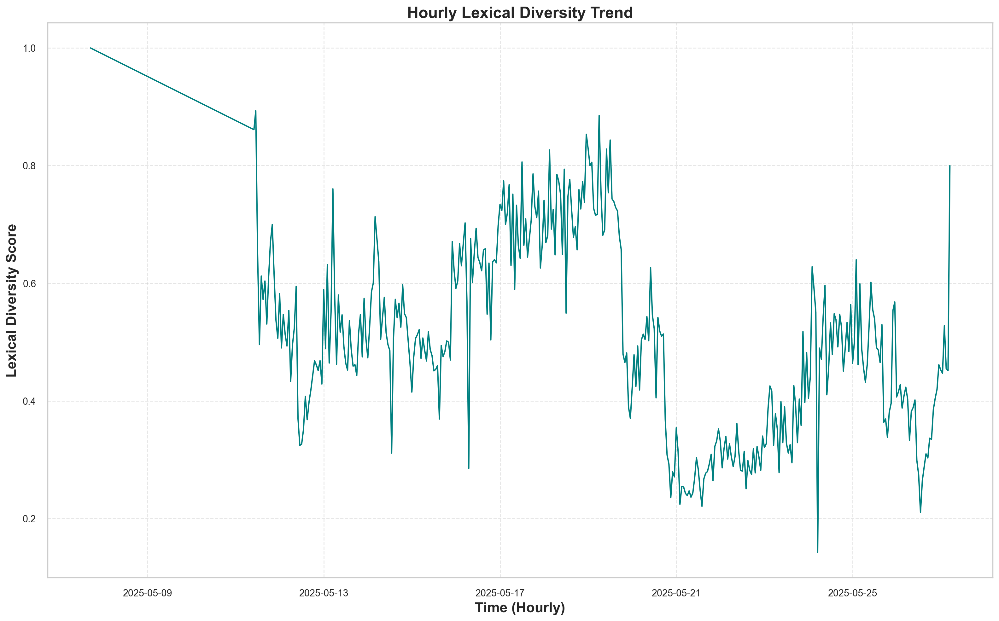

In [20]:
# Assuming df has a 'created_utc' column
df['date'] = pd.to_datetime(df['publishedAt'], errors='coerce')

# Grouping by hour instead of date
hourly_diversity = df.groupby(df['date'].dt.floor('H'))['clean_text_filtered'] \
    .apply(lambda x: len(set(" ".join(x).split())) / len(" ".join(x).split()) if len(" ".join(x).split()) > 0 else 0)

# Plotting the hourly trend
plt.plot(hourly_diversity.index, hourly_diversity.values, color='teal')
plt.title('Hourly Lexical Diversity Trend')
plt.xlabel('Time (Hourly)')
plt.ylabel('Lexical Diversity Score')
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

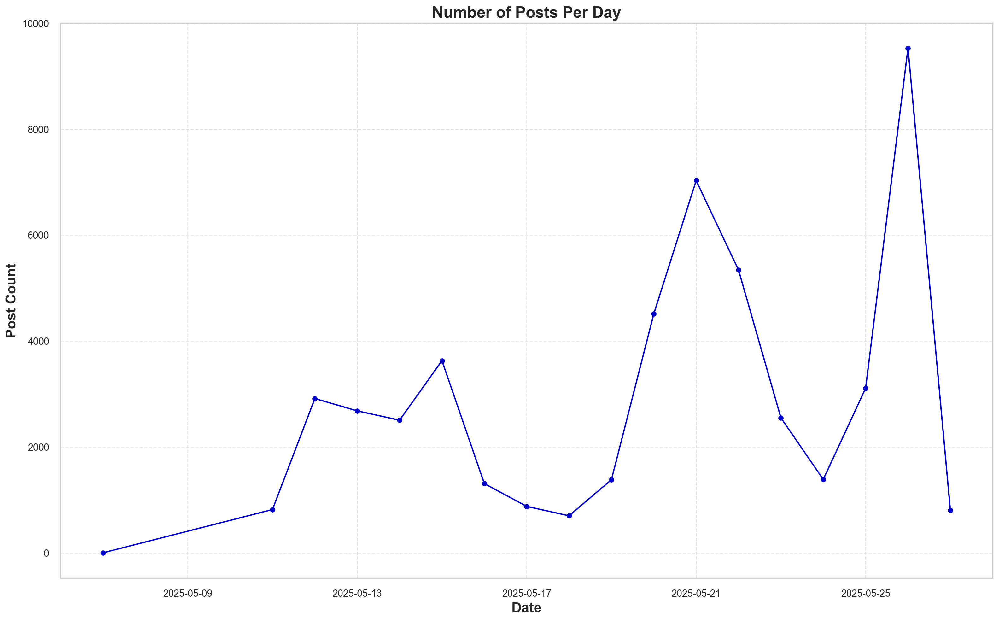

In [21]:
# Group by date (day)
daily_post_counts = df.groupby(df['date'].dt.date).size()

# Plotting the daily post counts
plt.plot(daily_post_counts.index, daily_post_counts.values, marker='o', color='mediumblue')
plt.title('Number of Posts Per Day')
plt.xlabel('Date')
plt.ylabel('Post Count')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

In [22]:
# Initilizing the corpus for LDA
corpus = df["clean_text_filtered"].tolist()

# Parameters for LDA and Vectorizers
min_df = 5
# n_topics = 5
max_df = 0.95           
max_iter = 25
n_top_words = 10
max_features = 4000
seed_value = 999

# Function to print topics
def print_topics(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print(f"\nTopic #{topic_idx + 1}:")
        print(", ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]))

# Function to display word clouds for each topic
def display_word_cloud(model, feature_names, sup_title):
    normalised_components = model.components_ / model.components_.sum(axis=1)[:, np.newaxis]
    topic_num = len(model.components_)
    col_num = 3
    row_num = int(math.ceil(topic_num / col_num))
    for topic_id, l_topic_dist in enumerate(normalised_components):
        l_word_prob = {feature_names[i]: _word_prob for i, _word_prob in enumerate(l_topic_dist)}
        wordcloud = WordCloud(background_color='black').generate_from_frequencies(l_word_prob)
        plt.subplot(row_num, col_num, topic_id + 1)
        plt.suptitle(sup_title, fontsize=20, fontweight='bold')
        plt.title(f'Topic {topic_id + 1}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
    plt.tight_layout()
    plt.show()



In [23]:
# from sklearn.decomposition import LatentDirichletAllocation
# from sklearn.feature_extraction.text import CountVectorizer
# from gensim.models.coherencemodel import CoherenceModel
# from gensim.corpora.dictionary import Dictionary

# # 1. Create a CountVectorizer
# count_vec = CountVectorizer(
#     max_df=max_df,
#     min_df=min_df,
#     stop_words='english',
#     lowercase=True,
#     max_features=max_features
# )
# X = count_vec.fit_transform(corpus)
# feature_names = count_vec.get_feature_names_out()

# # 2. Build Gensim corpus and dictionary for coherence
# texts = [doc.split() for doc in corpus]
# dictionary = Dictionary(texts)
# gensim_corpus = [dictionary.doc2bow(text) for text in texts]

# # 3. Sweep over number of topics
# topic_range = range(2, 10)   # try from 2 up to 10 topics
# perplexities = []
# coherence_scores = []

# for k in topic_range:
#     # fit sklearn LDA
#     lda = LatentDirichletAllocation(
#         n_components=k,
#         max_iter=max_iter,
#         random_state=seed_value,
#         learning_method='online' # for large datasets
#     ).fit(X)

#     # 3a. record perplexity (lower = better fit of model to data)
#     perplexities.append(lda.perplexity(X))

#     # 3b. extract top-words per topic for coherence
#     topics = []
#     for comp in lda.components_:
#         top_indices = comp.argsort()[:-10-1:-1]        # top-10 words
#         topics.append([feature_names[i] for i in top_indices])

#     # 3c. compute c_v coherence
#     cm = CoherenceModel(
#         topics=topics,
#         texts=texts,
#         dictionary=dictionary,
#         coherence='c_v'
#     )
#     coherence_scores.append(cm.get_coherence())

# # 4. Plot both metrics
# fig, ax1 = plt.subplots()

# color = 'tab:blue'
# ax1.set_xlabel('Number of topics')
# ax1.set_ylabel('Perplexity', color=color)
# ax1.plot(topic_range, perplexities, marker='o', color=color)
# ax1.tick_params(axis='y', labelcolor=color)

# ax2 = ax1.twinx()
# color = 'tab:red'
# ax2.set_ylabel('Coherence (c_v)', color=color)
# ax2.plot(topic_range, coherence_scores, marker='s', color=color)
# ax2.tick_params(axis='y', labelcolor=color)

# plt.title('Perplexity and Coherence vs. Number of Topics')
# plt.show()


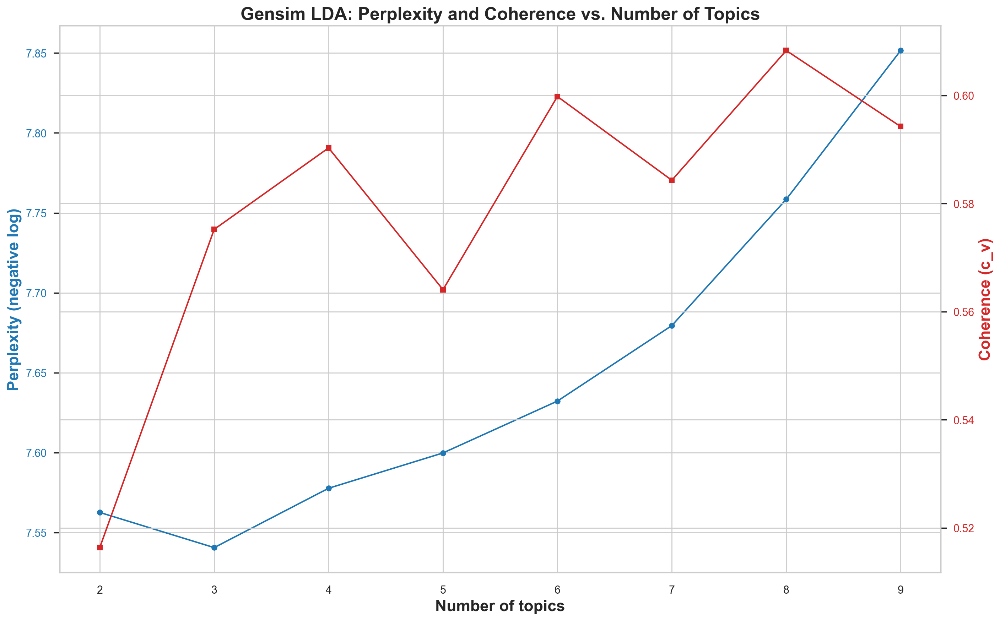

In [28]:
from gensim.models.ldamodel import LdaModel
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt

# 1. Create a CountVectorizer to get the vocabulary
count_vec = CountVectorizer(
    max_df=max_df,
    min_df=min_df,
    stop_words='english',
    lowercase=True,
    max_features=max_features
)
X = count_vec.fit_transform(corpus)
feature_names = count_vec.get_feature_names_out()

# 2. Prepare data for Gensim
texts = [doc.split() for doc in corpus]  # tokenized texts
dictionary = Dictionary(texts)
gensim_corpus = [dictionary.doc2bow(text) for text in texts]

# 3. Sweep over number of topics
topic_range = range(2, 10)
perplexities = []
coherence_scores = []

for k in topic_range:
    # Train LDA model using Gensim
    lda_model = LdaModel(
        corpus=gensim_corpus,
        id2word=dictionary,
        num_topics=k,
        random_state=seed_value,
        iterations=max_iter,
        passes=10,               # Increase passes for better quality
        eval_every=None          # Disable built-in perplexity eval
    )

    # 3a. Gensim's bound = - per-word likelihood = log perplexity
    perplexity = lda_model.log_perplexity(gensim_corpus)
    perplexities.append(-perplexity)  # Lower is better → we negate it for plotting

    # 3b. Extract topics for coherence
    topics = [[word for word, prob in lda_model.show_topic(topicid, topn=n_top_words)]
              for topicid in range(k)]

    # 3c. Coherence score
    cm = CoherenceModel(
        topics=topics,
        texts=texts,
        dictionary=dictionary,
        coherence='c_v'
    )
    coherence_scores.append(cm.get_coherence())

# 4. Plot both metrics
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Number of topics')
ax1.set_ylabel('Perplexity (negative log)', color=color)
ax1.plot(topic_range, perplexities, marker='o', color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Coherence (c_v)', color=color)
ax2.plot(topic_range, coherence_scores, marker='s', color=color)
ax2.tick_params(axis='y', labelcolor=color)

plt.title('Gensim LDA: Perplexity and Coherence vs. Number of Topics')
plt.show()

In [29]:
# Number of topics to use based on the above analysis
n_topics = 6

# Initializing LDA model
base_lda_model = LatentDirichletAllocation(
    n_components=n_topics,
    max_iter=max_iter,
    random_state=seed_value,
    learning_method='online' # for large datasets
)

# Fitting CountVectorizer to the corpus
topic_fit_count_vec = count_vec.fit_transform(corpus)
feature_names_count = count_vec.get_feature_names_out()

# Fitting LDA model with CountVectorizer
lda_model_count_vec = base_lda_model
lda_model_count_vec.fit(topic_fit_count_vec)

# Displaying Topics for LDA model with CountVectorizer
print_topics(lda_model_count_vec, feature_names_count, n_top_words)

# Visualizing Topics for CountVectorizer using pyLDAvis
pyLDAvis.enable_notebook()
panel =  pyLDAvis.lda_model.prepare(lda_model_count_vec, topic_fit_count_vec, count_vec, mds='tsne')
pyLDAvis.display(panel)


Topic #1:
putin, trump, like, man, play, thank, better, god, love, truth

Topic #2:
believ, deal, continu, media, power, care, ye, propaganda, person, watch

Topic #3:
russia, ukrain, russian, ukrainian, nato, finland, year, militari, war, attack

Topic #4:
putin, trump, war, know, talk, zelenski, presid, like, say, stop

Topic #5:
russia, ukrain, want, countri, war, eu, europ, nato, fight, start

Topic #6:
news, china, laugh, new, india, loud, channel, good, world, live


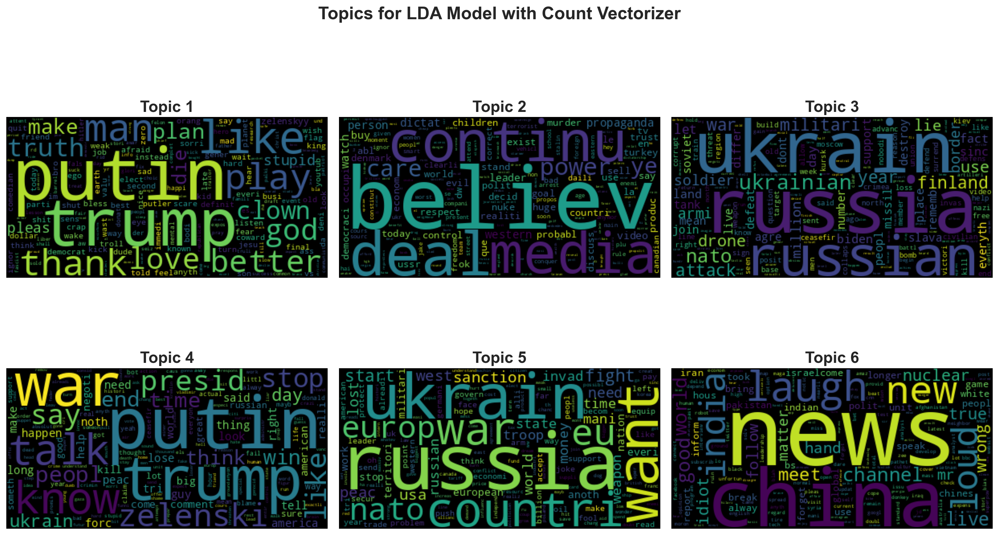

In [30]:
# Function to display word clouds for each topic
def display_word_cloud(model, feature_names, sup_title):
    normalised_components = model.components_ / model.components_.sum(axis=1)[:, np.newaxis]
    topic_num = len(model.components_)
    col_num = 3
    row_num = int(math.ceil(topic_num / col_num))
    for topic_id, l_topic_dist in enumerate(normalised_components):
        l_word_prob = {feature_names[i]: _word_prob for i, _word_prob in enumerate(l_topic_dist)}
        wordcloud = WordCloud(background_color='black').generate_from_frequencies(l_word_prob)
        plt.subplot(row_num, col_num, topic_id + 1)
        plt.suptitle(sup_title, fontsize=20, fontweight='bold')
        plt.title(f'Topic {topic_id + 1}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
    plt.tight_layout()
    plt.show()


# Displaying topic-wise wordclouds for CountVectorizer model
display_word_cloud(lda_model_count_vec, feature_names_count, sup_title="Topics for LDA Model with Count Vectorizer")

In [31]:
df.columns

Index(['videoId', 'text', 'title', 'description', 'channelTitle',
       'videoPublishedAt', 'tags', 'viewCount', 'videoLikeCount',
       'videoCommentCount', 'type', 'commentId', 'author', 'likeCount',
       'publishedAt', 'parentId', 'authorChannelId', 'processed_tokens',
       'clean_text_filtered', 'sentiment_score', 'sentiment', 'date'],
      dtype='object')

In [32]:
df.dtypes

videoId                             object
text                                object
title                               object
description                         object
channelTitle                        object
videoPublishedAt       datetime64[ns, UTC]
tags                                object
viewCount                          float64
videoLikeCount                     float64
videoCommentCount                  float64
type                                object
commentId                           object
author                              object
likeCount                          float64
publishedAt            datetime64[ns, UTC]
parentId                            object
authorChannelId                     object
processed_tokens                    object
clean_text_filtered                 object
sentiment_score                    float64
sentiment                           object
date                   datetime64[ns, UTC]
dtype: object

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51254 entries, 0 to 51253
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   videoId              51254 non-null  object             
 1   text                 51254 non-null  object             
 2   title                51254 non-null  object             
 3   description          51254 non-null  object             
 4   channelTitle         51254 non-null  object             
 5   videoPublishedAt     175 non-null    datetime64[ns, UTC]
 6   tags                 175 non-null    object             
 7   viewCount            175 non-null    float64            
 8   videoLikeCount       174 non-null    float64            
 9   videoCommentCount    175 non-null    float64            
 10  type                 51254 non-null  object             
 11  commentId            51079 non-null  object             
 12  author            

In [34]:
df.describe()

,viewCount,videoLikeCount,videoCommentCount,likeCount,sentiment_score
count,1.750000e+02,174.000000,175.00000,51079.000000,51254.000000
mean,1.475762e+05,2803.827586,479.60000,2.760175,-0.075318
std,3.517949e+05,5780.746180,945.02162,16.025037,0.441987
min,9.940000e+02,22.000000,10.00000,0.000000,-0.999700
25%,2.374500e+04,288.000000,41.00000,0.000000,-0.421500
50%,5.164800e+04,773.000000,126.00000,0.000000,0.000000
75%,1.578670e+05,2906.500000,449.50000,1.000000,0.102700
max,3.978011e+06,41734.000000,6808.00000,857.000000,0.998100


In [35]:
# Count total number of comments
total_comments = df[df['type'] == 'comment'].shape[0]
print(f"Total number of comments: {total_comments}")

# Count total number of videos
total_videos = df[df['type'] == 'video'].shape[0]
print(f"Total number of videos  : {total_videos}")

# Count total number of replies
total_replies = df[df['type'] == 'reply'].shape[0]
print(f"Total number of replies : {total_replies}")

Total number of comments: 32653
Total number of videos  : 175
Total number of replies : 18426


In [36]:
# Count total number of comments per video
comments_per_video = df[df['type'] == 'comment'].groupby('videoId').size()
print(f"Total number of comments per video:")
comments_per_video

Total number of comments per video:


videoId
0YPV_aQhB2I    662
1ExuuRLWf7M     16
1T8Nlmipvkc    262
1kaC4Du67iE     27
2CGp0Gk68B8     72
              ... 
x_DyyPMaVR0    263
xlmMdpAmoy8     38
yMMizBEBNK4     56
yRPg18JGJLQ    136
yeZyEwZHJ4A    790
Length: 136, dtype: int64

In [37]:
# Save the final DataFrame to a CSV file
output_file_path = '../Data/youtube_russiaukraine_cleaned.csv'
df.to_csv(output_file_path, index=False, encoding='utf-8')
print(f"DataFrame saved to {output_file_path}")

DataFrame saved to ../Data/youtube_russiaukraine_cleaned.csv


In [38]:
df_of_videos = df.copy()
df_of_videos.head()

,videoId,text,title,description,channelTitle,videoPublishedAt,tags,viewCount,videoLikeCount,videoCommentCount,...,author,likeCount,publishedAt,parentId,authorChannelId,processed_tokens,clean_text_filtered,sentiment_score,sentiment,date
0,x_DyyPMaVR0,Russia-Ukraine: Trump calls Putin 'crazy’ afte...,Russia-Ukraine: Trump calls Putin 'crazy’ afte...,"In Ukraine, swarms of Russian drones filled th...",Channel 4 News,2025-05-26 17:50:04+00:00,Russia;Ukraine;Turkey;Ankara;Russia Ukraine Wa...,62099.0,544.0,455.0,...,NaN,NaN,NaT,NaN,NaN,"[trump, call, putin, crazi, largest, air, atta...",trump call putin crazi largest air attack war ...,-0.9735,Negative,NaT
1,x_DyyPMaVR0,Yet no mention of the fact that in the recent ...,nan,nan,nan,NaT,NaN,NaN,NaN,NaN,...,@richieboy1971,0.0,2025-05-27 04:41:25+00:00,None,UCqaL9sb-wqAKneSzwju92OA,"[yet, mention, fact, recent, negoti, prison, s...",yet mention fact recent negoti prison swap ukr...,-0.7269,Negative,2025-05-27 04:41:25+00:00
2,x_DyyPMaVR0,Trump talks a lot but none of it ever transfor...,nan,nan,nan,NaT,NaN,NaN,NaN,NaN,...,@Turtle_Zed,0.0,2025-05-27 04:34:40+00:00,None,UCNImr4HOMoOBjb3Y0MUW-Uw,"[trump, talk, lot, none, ever, transform, acti...",trump talk lot none ever transform action frie...,0.4939,Positive,2025-05-27 04:34:40+00:00
3,x_DyyPMaVR0,Haaha the russian bots are terrified. Just bas...,nan,nan,nan,NaT,NaN,NaN,NaN,NaN,...,@Vykandar,0.0,2025-05-27 04:30:09+00:00,None,UC92JUclfl0YcAqK4xlpRc_w,"[russian, bot, terrifi, base, comment, section...",russian bot terrifi base comment section tell ...,0.0000,Neutral,2025-05-27 04:30:09+00:00
4,x_DyyPMaVR0,send the troops president trump,nan,nan,nan,NaT,NaN,NaN,NaN,NaN,...,@stmartinshirt,0.0,2025-05-27 04:29:53+00:00,None,UC_hAirOy_3qohESaQ0P6ttg,"[send, troop, presid, trump]",send troop presid trump,0.0000,Neutral,2025-05-27 04:29:53+00:00


In [39]:
df_of_videos.dtypes

videoId                             object
text                                object
title                               object
description                         object
channelTitle                        object
videoPublishedAt       datetime64[ns, UTC]
tags                                object
viewCount                          float64
videoLikeCount                     float64
videoCommentCount                  float64
type                                object
commentId                           object
author                              object
likeCount                          float64
publishedAt            datetime64[ns, UTC]
parentId                            object
authorChannelId                     object
processed_tokens                    object
clean_text_filtered                 object
sentiment_score                    float64
sentiment                           object
date                   datetime64[ns, UTC]
dtype: object

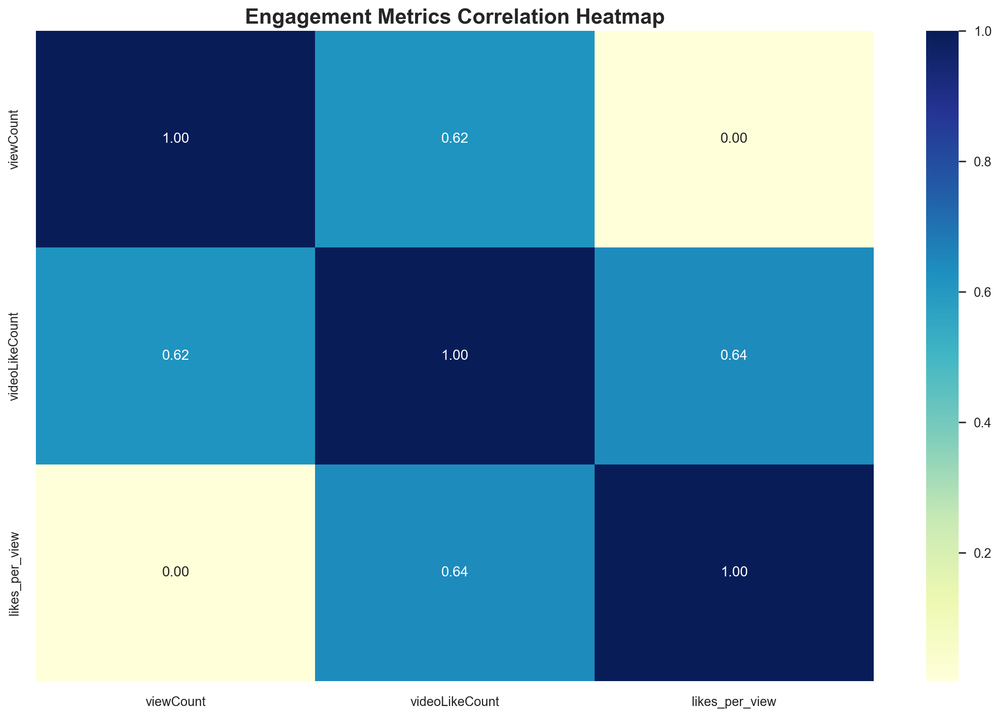

In [40]:
# Calculate likes per view ratio
df_of_videos['likes_per_view'] = df_of_videos['videoLikeCount'] / df_of_videos['viewCount']
# plt.figure(figsize=(12, 6))
sns.heatmap(df_of_videos[['viewCount', 'videoLikeCount', 'likes_per_view']].corr(), 
            annot=True, cmap='YlGnBu', fmt='.2f')
plt.title('Engagement Metrics Correlation Heatmap')
plt.show()

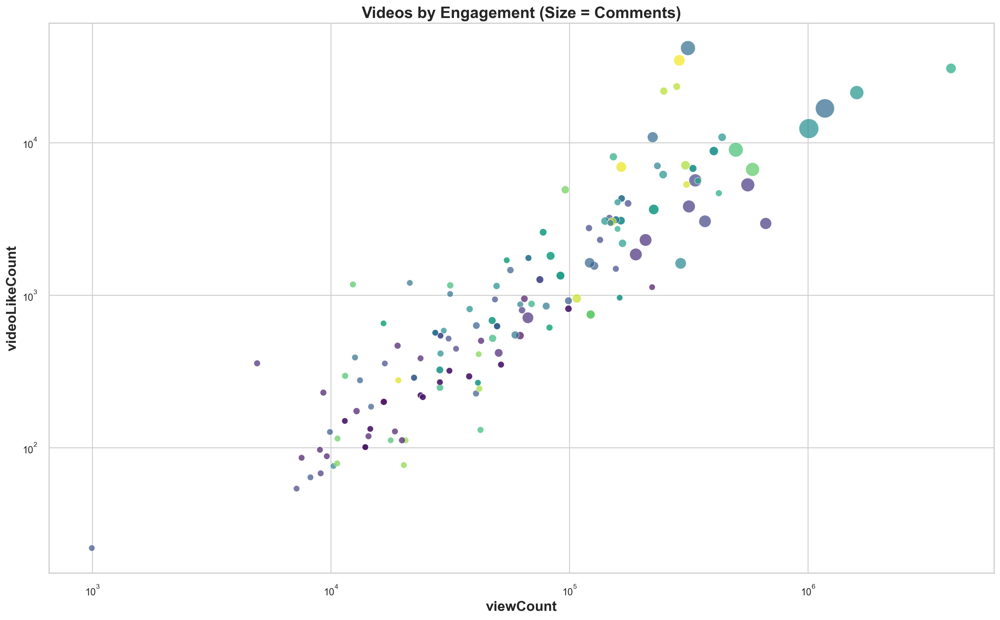

In [41]:
# sns.scatterplot(data=df_of_videos, x='viewCount', y='videoLikeCount', 
#                 size='videoCommentCount', hue='channelTitle',
#                 sizes=(50, 500), alpha=0.7, palette='viridis')
# plt.xscale('log')
# plt.yscale('log')
# plt.title('Videos by Engagement (Size = Comments)')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()



sns.scatterplot(data=df_of_videos, x='viewCount', y='videoLikeCount', 
                size='videoCommentCount', hue='channelTitle',
                sizes=(50, 500), alpha=0.7, palette='viridis', legend=False)  # <-- Add legend=False
plt.xscale('log')
plt.yscale('log')
plt.title('Videos by Engagement (Size = Comments)')
plt.tight_layout()

In [42]:
# df_of_videos['date'] = pd.to_datetime(df_of_videos['videoPublishedAt'])
# df_of_videos.groupby(df_of_videos['date'].dt.to_period('M'))['videoCommentCount'].sum().plot(kind='bar', color='#3498db')
# plt.title('Monthly Comment Activity')
# plt.xlabel('Month')
# plt.ylabel('Total Comments')
# plt.xticks(rotation=360)
# plt.grid(axis='y', linestyle='--')

Text(0.5, 1.0, 'Most Frequent Tags in Videos')

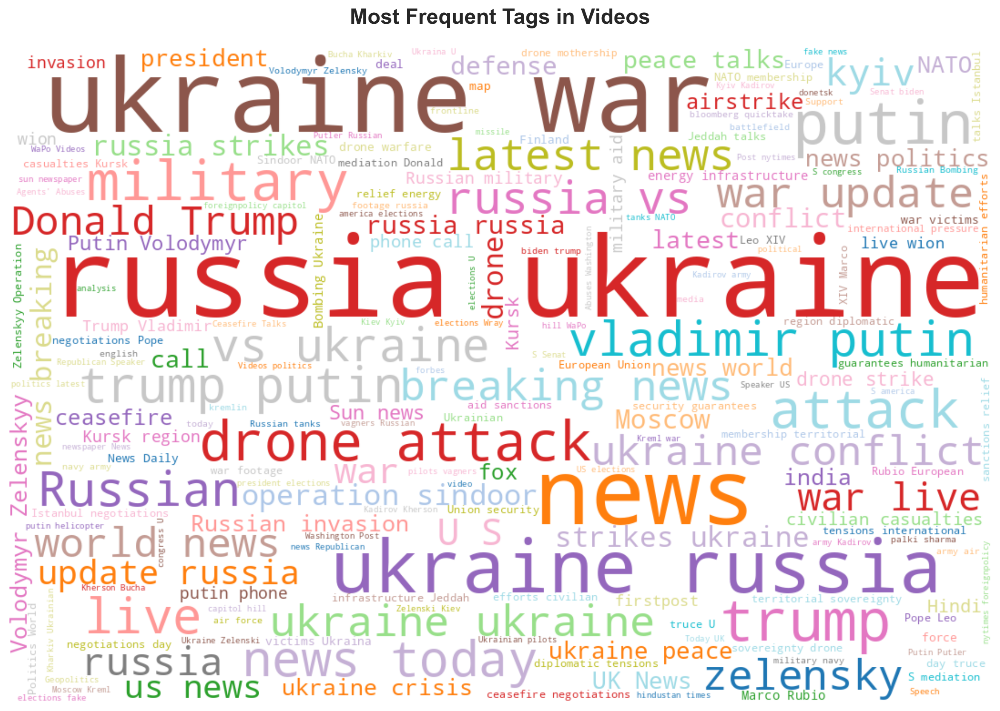

In [43]:
from wordcloud import WordCloud

tags_text = ' '.join(df_of_videos['tags'].dropna())
wordcloud = WordCloud(width=1080, height=720, 
                      background_color='white', colormap='tab20').generate(tags_text)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Most Frequent Tags in Videos', pad=20)

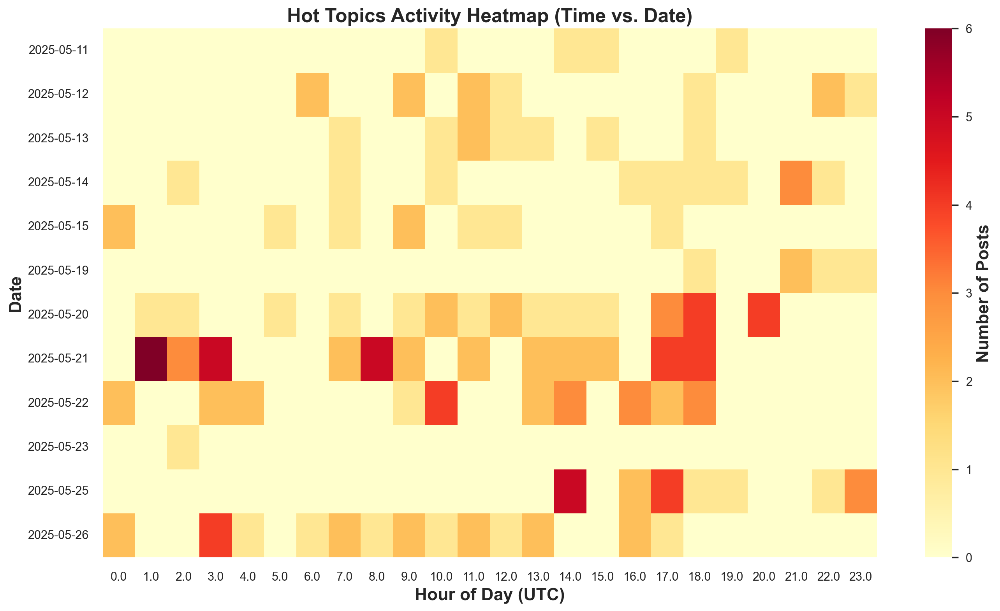

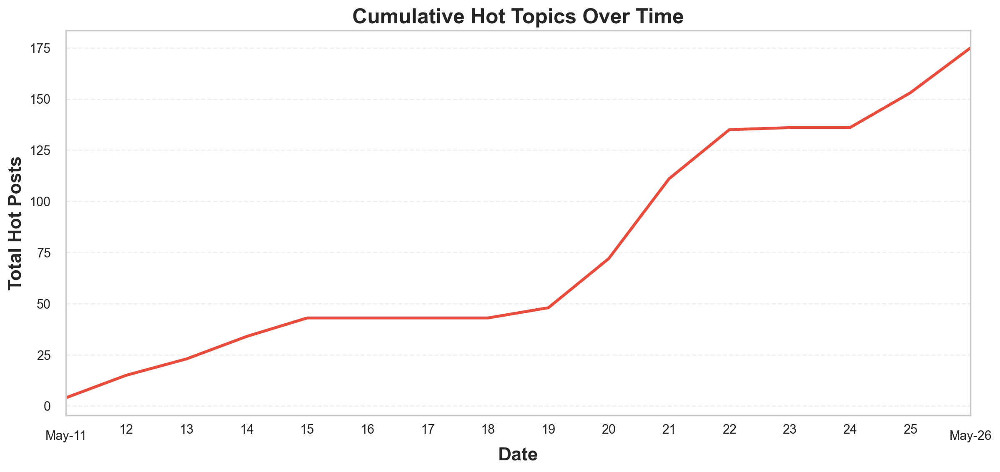

In [44]:

from matplotlib.dates import DateFormatter

# Convert timestamp
df_of_videos['datetime'] = pd.to_datetime(df_of_videos['videoPublishedAt'])

# 1. Plot Topic Frequency Heatmap
plt.figure(figsize=(14, 8))

# Resample by day/week
daily_counts = df_of_videos.set_index('datetime').resample('D').size()

# Create heatmap data
heatmap_data = df_of_videos.assign(
    hour=df_of_videos['datetime'].dt.hour,
    date=df_of_videos['datetime'].dt.date
).pivot_table(index='date', columns='hour', values='title', aggfunc='count')

# Plot
sns.heatmap(heatmap_data.fillna(0), cmap='YlOrRd', cbar_kws={'label': 'Number of Posts'})
plt.title('Hot Topics Activity Heatmap (Time vs. Date)')
plt.xlabel('Hour of Day (UTC)')
plt.ylabel('Date')
plt.tight_layout()
plt.show()

# 2. Cumulative Trend Line
plt.figure(figsize=(14, 6))
daily_counts.cumsum().plot(color='#e74c3c', linewidth=2.5)
plt.title('Cumulative Hot Topics Over Time')
plt.xlabel('Date')
plt.ylabel('Total Hot Posts')
plt.grid(True, linestyle='--', alpha=0.3)
date_form = DateFormatter("%b-%d")
plt.gca().xaxis.set_major_formatter(date_form)
plt.show()

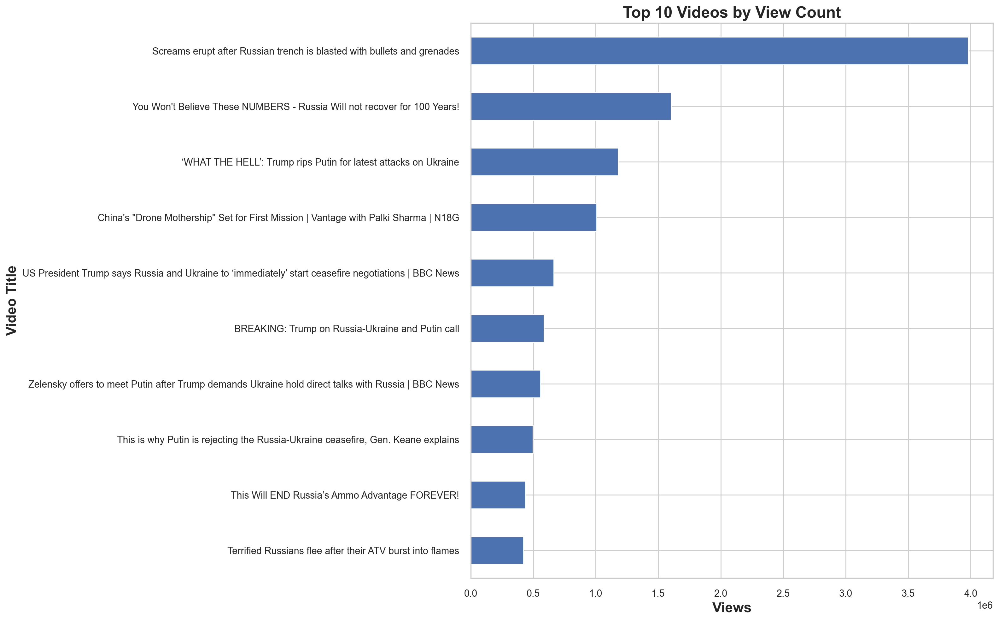

In [45]:
#########################################################
## GPT 
#########################################################



# ensure viewCount is numeric
df_of_videos['viewCount'] = pd.to_numeric(df_of_videos['viewCount'], errors='coerce')

# pick top 10
top10 = (
    df_of_videos.drop_duplicates('videoId')
                .nlargest(10, 'viewCount')
                .set_index('title')['viewCount']
)

top10.sort_values().plot.barh()
plt.title("Top 10 Videos by View Count")
plt.xlabel("Views")
plt.ylabel("Video Title")
plt.tight_layout()
plt.show()


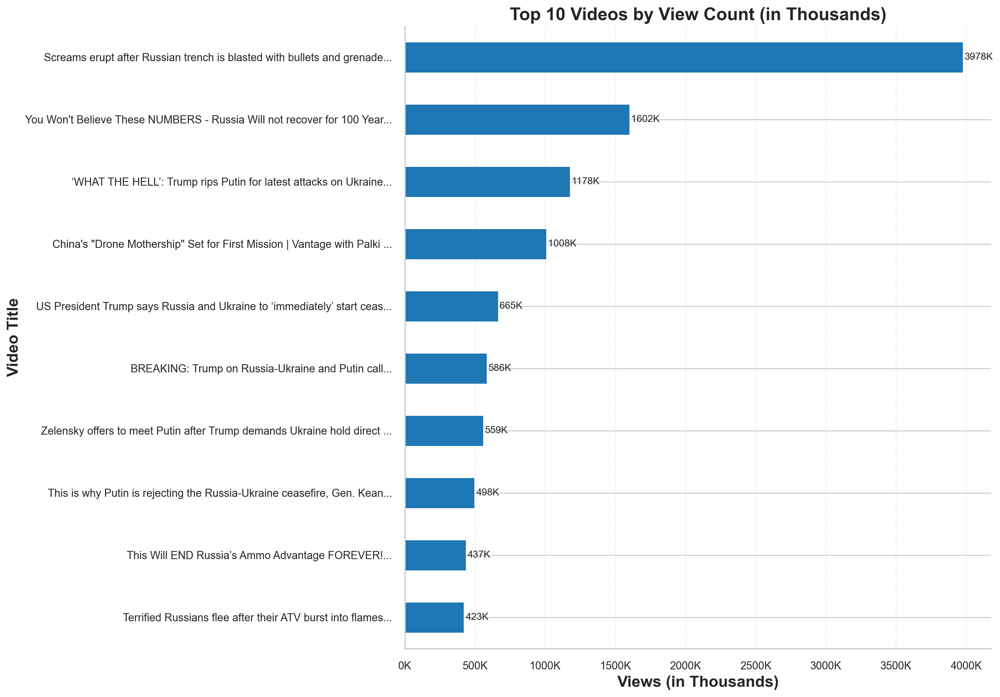

In [46]:
import matplotlib.ticker as ticker
import seaborn as sns

# Convert viewCount to numeric and get top 10 videos
df_of_videos['viewCount'] = pd.to_numeric(df_of_videos['viewCount'], errors='coerce')
top10 = (
    df_of_videos.drop_duplicates('videoId')
                .nlargest(10, 'viewCount')
                .set_index('title')['viewCount']
)

# Create plot
# plt.figure(figsize=(16, 8))
ax = top10.sort_values().plot.barh(color='#1f77b4')

# Format ALL numbers in thousands (K) 
def format_k(x, pos):
    return f'{x/1000:.0f}K'

ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_k))

# Add value labels
for i, v in enumerate(top10.sort_values()):
    ax.text(v + 10000, i, f'{v/1000:.0f}K', 
            va='center', fontsize=10)

# Style
plt.title('Top 10 Videos by View Count (in Thousands)', loc='center')
plt.xlabel('Views (in Thousands)')
plt.ylabel('Video Title')
plt.grid(axis='x', linestyle='--', alpha=0.3)
sns.despine()
plt.tight_layout()
# Trim y-axis labels
plt.gca().set_yticklabels([label.get_text()[:70] + "..." for label in plt.gca().get_yticklabels()])


plt.show()

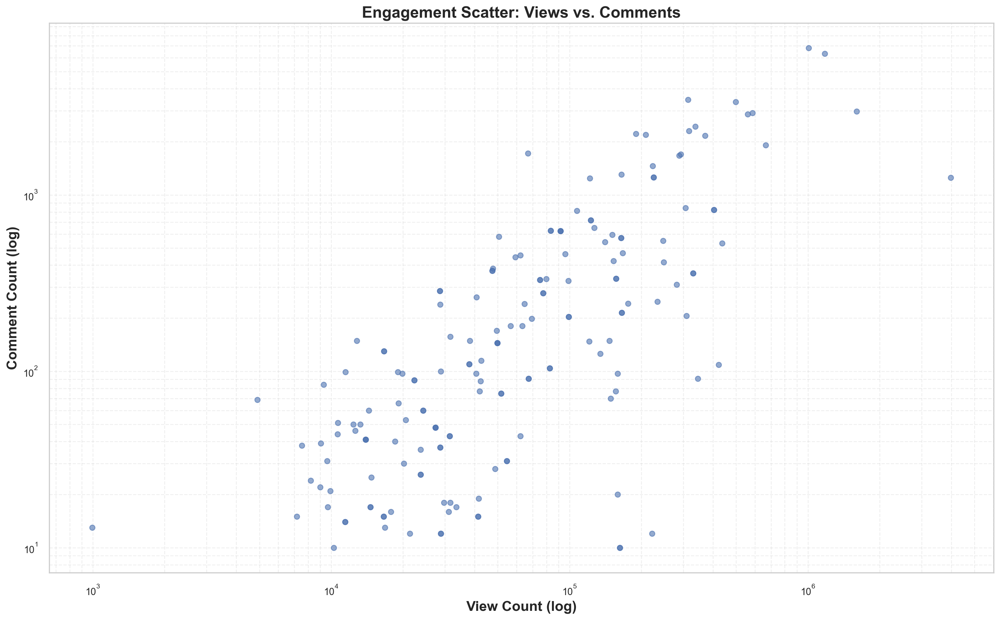

In [47]:

plt.scatter(
    df_of_videos['viewCount'],
    df_of_videos['videoCommentCount'],
    alpha=0.6
)
plt.xscale('log')
plt.yscale('log')
plt.xlabel("View Count (log)")
plt.ylabel("Comment Count (log)")
plt.title("Engagement Scatter: Views vs. Comments")
plt.grid(True, which="both", ls="--", alpha=0.3)
plt.tight_layout()
plt.show()


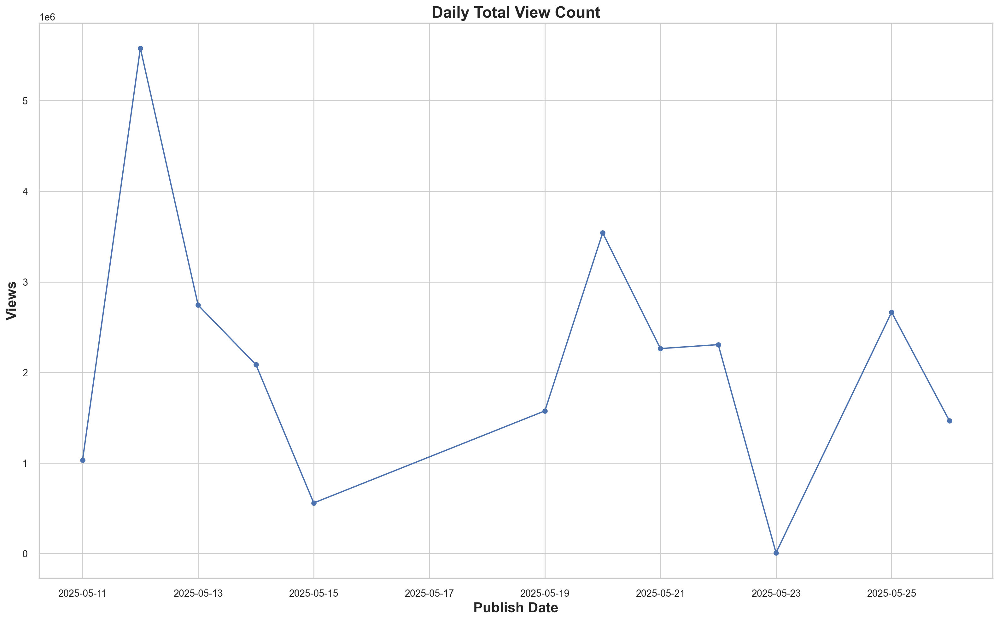

In [48]:
# parse dates
df_of_videos['videoPublishedAt'] = pd.to_datetime(df_of_videos['videoPublishedAt'])

# aggregate daily comment counts
daily_comments = (
    df_of_videos.groupby(df_of_videos['videoPublishedAt'].dt.date)
                ['viewCount']
                .agg('sum')
              
)

daily_comments.plot(marker='o')
plt.title("Daily Total View Count")
plt.xlabel("Publish Date")
plt.ylabel("Views")
plt.tight_layout()
plt.show()
